In [1]:
import os
import json
import argparse
import time

import numpy as np

import torch
from torch.autograd import Variable
import torch.nn.functional as F
import torch.nn as nn

import matplotlib
import matplotlib.pyplot as plt

import networkx as nx
from sklearn.utils.class_weight import compute_class_weight

from tensorboardX import SummaryWriter
from fastprogress import master_bar, progress_bar

# Remove warning
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
from scipy.sparse import SparseEfficiencyWarning
warnings.simplefilter('ignore', SparseEfficiencyWarning)

from config import *
from utils.graph_utils import *
from utils.google_tsp_reader import GoogleTSPReader
from utils.plot_utils import *
from models.gcn_model import ResidualGatedGCNModel
from utils.model_utils import *

In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png')

# Load configurations

In [3]:
config_path = "logs/tsp20/config.json"
config = get_config(config_path)
print("Loaded {}:\n{}".format(config_path, config))

Loaded logs/tsp20/config.json:
{'expt_name': 'tsp20', 'gpu_id': '1', 'train_filepath': './data/tsp20_train_concorde.txt', 'val_filepath': './data/tsp20_val_concorde.txt', 'test_filepath': './data/tsp20_test_concorde.txt', 'num_nodes': 20, 'num_neighbors': -1, 'node_dim': 2, 'voc_nodes_in': 2, 'voc_nodes_out': 2, 'voc_edges_in': 3, 'voc_edges_out': 2, 'beam_size': 1280, 'hidden_dim': 300, 'num_layers': 30, 'mlp_layers': 3, 'aggregation': 'mean', 'max_epochs': 1500, 'val_every': 5, 'test_every': 100, 'batch_size': 20, 'batches_per_epoch': 500, 'accumulation_steps': 1, 'learning_rate': 0.001, 'decay_rate': 1.01}


In [4]:
config.gpu_id = "0"
config.batch_size = 1
config.accumulation_steps = 1
config.beam_size = 1280

# Configure GPU options

In [5]:
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = str(config.gpu_id)  

In [6]:
if torch.cuda.is_available():
    print("CUDA available, using GPU ID {}".format(config.gpu_id))
    dtypeFloat = torch.cuda.FloatTensor
    dtypeLong = torch.cuda.LongTensor
    torch.cuda.manual_seed(1)
else:
    print("CUDA not available")
    dtypeFloat = torch.FloatTensor
    dtypeLong = torch.LongTensor
    torch.manual_seed(1)

CUDA not available


# Test data loading

Number of batches of size 1: 1000000
Batch generation took: 0.001 sec
edges: (1, 20, 20)
edges_values: (1, 20, 20)
edges_targets: (1, 20, 20)
nodes: (1, 20)
nodes_target: (1, 20)
nodes_coord: (1, 20, 2)
tour_nodes: (1, 20)
tour_len: (1,)


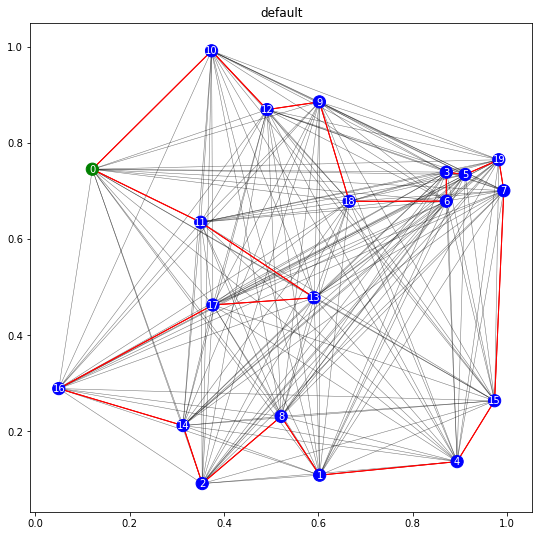

In [7]:
num_nodes = config.num_nodes
num_neighbors = config.num_neighbors
batch_size = config.batch_size
train_filepath = config.train_filepath
dataset = GoogleTSPReader(num_nodes, num_neighbors, batch_size, train_filepath)
print("Number of batches of size {}: {}".format(batch_size, dataset.max_iter))

t = time.time()
batch = next(iter(dataset))  # Generate a batch of TSPs
print("Batch generation took: {:.3f} sec".format(time.time() - t))

print("edges:", batch.edges.shape)
print("edges_values:", batch.edges_values.shape)
print("edges_targets:", batch.edges_target.shape)
print("nodes:", batch.nodes.shape)
print("nodes_target:", batch.nodes_target.shape)
print("nodes_coord:", batch.nodes_coord.shape)
print("tour_nodes:", batch.tour_nodes.shape)
print("tour_len:", batch.tour_len.shape)

idx = 0
f = plt.figure(figsize=(9, 9))
a = f.add_subplot(111)
plot_tsp(a, batch.nodes_coord[idx], batch.edges[idx], batch.edges_values[idx], batch.edges_target[idx])

In [8]:
# Uncomment below to automatically compute the number of nearest neighbors to use in k-NN input graph
# if config.num_neighbors == -1:
#     dataset = GoogleTSPReader(config.num_nodes, config.num_neighbors, config.batch_size, config.train_filepath)
#     config.num_neighbors = get_max_k(dataset, max_iter=10000//config.batch_size)
#     print(f"New num_neighbors for k-NN input: {config.num_neighbors}")

# Instantiate model

In [9]:
# Instantiate the network
net = nn.DataParallel(ResidualGatedGCNModel(config, dtypeFloat, dtypeLong))
if torch.cuda.is_available():
    net.cuda()
print(net)

# Compute number of network parameters
nb_param = 0
for param in net.parameters():
    nb_param += np.prod(list(param.data.size()))
print('Number of parameters:', nb_param)

# Define optimizer
learning_rate = config.learning_rate
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)
print(optimizer)

DataParallel(
  (module): ResidualGatedGCNModel(
    (nodes_coord_embedding): Linear(in_features=2, out_features=300, bias=False)
    (edges_values_embedding): Linear(in_features=1, out_features=150, bias=False)
    (edges_embedding): Embedding(3, 150)
    (gcn_layers): ModuleList(
      (0): ResidualGatedGCNLayer(
        (node_feat): NodeFeatures(
          (U): Linear(in_features=300, out_features=300, bias=True)
          (V): Linear(in_features=300, out_features=300, bias=True)
        )
        (edge_feat): EdgeFeatures(
          (U): Linear(in_features=300, out_features=300, bias=True)
          (V): Linear(in_features=300, out_features=300, bias=True)
        )
        (bn_node): BatchNormNode(
          (batch_norm): BatchNorm1d(300, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        )
        (bn_edge): BatchNormEdge(
          (batch_norm): BatchNorm2d(300, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        )
      )
      (1): Re

# Load saved checkpoint

In [10]:
# Load checkpoint
log_dir = f"./logs/{config.expt_name}/"
if torch.cuda.is_available():
    checkpoint = torch.load(log_dir+"best_val_checkpoint.tar")
else:
    checkpoint = torch.load(log_dir+"best_val_checkpoint.tar", map_location='cpu')
# Load network state
net.load_state_dict(checkpoint['model_state_dict'])
# Load optimizer state
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
# Load other training parameters
epoch = checkpoint['epoch']
train_loss = checkpoint['train_loss']
val_loss = checkpoint['val_loss']
for param_group in optimizer.param_groups:
    learning_rate = param_group['lr']
print(f"Loaded checkpoint from epoch {epoch}")

Loaded checkpoint from epoch 1455


# Override beam search

In [11]:
def beamsearch_tour_nodes_shortest(y_pred_edges, x_edges_values, beam_size, batch_size, num_nodes,
                                   dtypeFloat, dtypeLong, probs_type='raw', random_start=False):
    """
    Performs beamsearch procedure on edge prediction matrices and returns possible TSP tours.

    Final predicted tour is the one with the shortest tour length.
    (Standard beamsearch returns the one with the highest probability and does not take length into account.)

    Args:
        y_pred_edges: Predictions for edges (batch_size, num_nodes, num_nodes)
        x_edges_values: Input edge distance matrix (batch_size, num_nodes, num_nodes)
        beam_size: Beam size
        batch_size: Batch size
        num_nodes: Number of nodes in TSP tours
        dtypeFloat: Float data type (for GPU/CPU compatibility)
        dtypeLong: Long data type (for GPU/CPU compatibility)
        probs_type: Type of probability values being handled by beamsearch (either 'raw'/'logits'/'argmax'(TODO))
        random_start: Flag for using fixed (at node 0) vs. random starting points for beamsearch

    Returns:
        shortest_tours: TSP tours in terms of node ordering (batch_size, num_nodes)

    """
    order = torch.ones(num_nodes, num_nodes).type(dtypeFloat)
    order[2,3] = 0
    order[4,5] = 0
    order[10,9] = 0
    order[12,11] = 0
    order[16,15] = 0
    mask = order.prod(0).unsqueeze(0).unsqueeze(1).expand(batch_size, beam_size, num_nodes)

    if probs_type == 'raw':
        # Compute softmax over edge prediction matrix
        y = F.softmax(y_pred_edges, dim=3)  # B x V x V x voc_edges
        # Consider the second dimension only
        y = y[:, :, :, 1]  # B x V x V
    elif probs_type == 'logits':
        # Compute logits over edge prediction matrix
        y = F.log_softmax(y_pred_edges, dim=3)  # B x V x V x voc_edges
        # Consider the second dimension only
        y = y[:, :, :, 1]  # B x V x V
        y[y == 0] = -1e-20  # Set 0s (i.e. log(1)s) to very small negative number
    # Perform beamsearch
    beamsearch = Beamsearch(beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type, random_start)
    
    mask1 = mask.detach().clone()
    mask1[mask1 == 0] = 1e-20
    trans_probs = y.gather(1, beamsearch.get_current_state()) * mask1

    for step in range(num_nodes - 1):
        beamsearch.advance(trans_probs)

        current_origin = beamsearch.get_current_origin()
        mask = mask.gather(1, current_origin.unsqueeze(2).expand_as(mask))

        current_state = beamsearch.get_current_state()
        update_mask = torch.ones(mask.size()).type(dtypeFloat) - order.squeeze(0).expand(batch_size, num_nodes, num_nodes).gather(1, current_state)
        mask = mask + update_mask - mask * update_mask

        mask1 = mask.detach().clone()
        mask1[mask1 == 0] = 1e-20
        trans_probs = y.gather(1, beamsearch.get_current_state()) * mask1

    # Initially assign shortest_tours as most probable tours i.e. standard beamsearch
    ends = torch.zeros(batch_size, 1).type(dtypeLong)
    shortest_tours = beamsearch.get_hypothesis(ends)
    # Compute current tour lengths
    shortest_lens = [1e6] * len(shortest_tours)
    for idx in range(len(shortest_tours)):
        shortest_lens[idx] = tour_nodes_to_tour_len(shortest_tours[idx].cpu().numpy(),
                                                    x_edges_values[idx].cpu().numpy())
    # Iterate over all positions in beam (except position 0 --> highest probability)
    for pos in range(1, beam_size):
        ends = pos * torch.ones(batch_size, 1).type(dtypeLong)  # New positions
        hyp_tours = beamsearch.get_hypothesis(ends)
        for idx in range(len(hyp_tours)):
            
            # Check if order is correct
            isValidTour = True
            hyp_nodes = hyp_tours[idx]
            new_order = order.detach().clone()
            allowed = new_order.prod(0)
            for node in hyp_nodes:
                if allowed[node] == 0:
                    isValidTour = False
                new_order[node, :] = 1
                allowed = new_order.prod(0)
            if not isValidTour:
                continue
            
            hyp_nodes = hyp_tours[idx].cpu().numpy()
            hyp_len = tour_nodes_to_tour_len(hyp_nodes, x_edges_values[idx].cpu().numpy())
            # Replace tour in shortest_tours if new length is shorter than current best
            if hyp_len < shortest_lens[idx] and is_valid_tour(hyp_nodes, num_nodes):
                shortest_tours[idx] = hyp_tours[idx]
                shortest_lens[idx] = hyp_len
    return shortest_tours

# Visualize model predictions

Class weights: [0.55555556 5.        ]
Predicted tour length: 5.323 (mean)
Groundtruth tour length: 3.801 (mean)


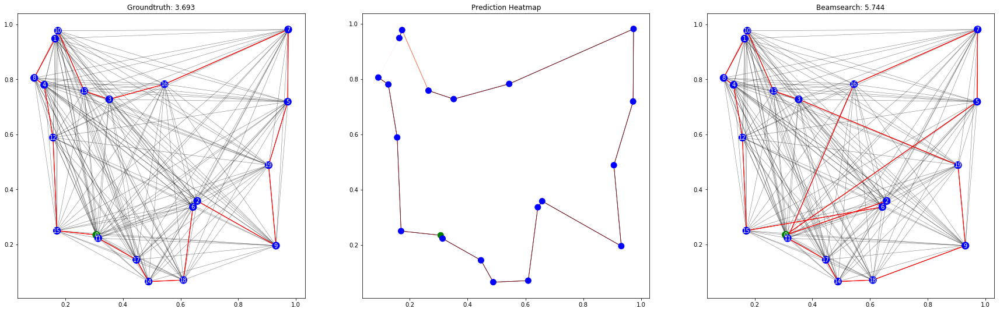

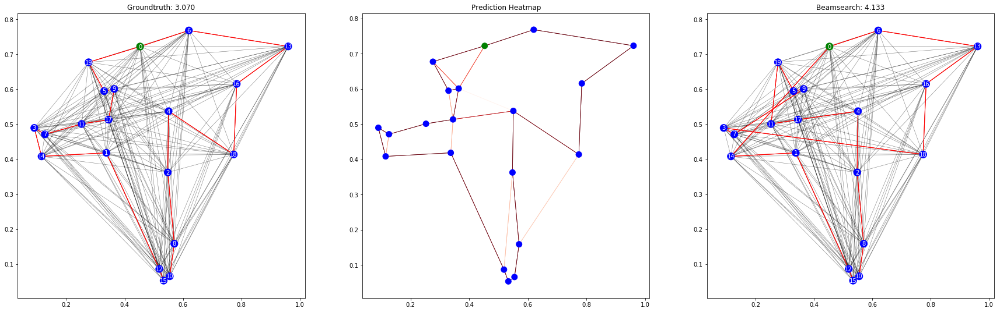

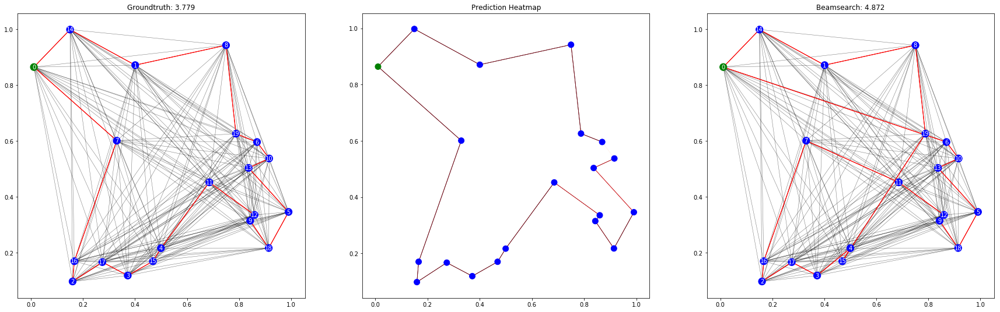

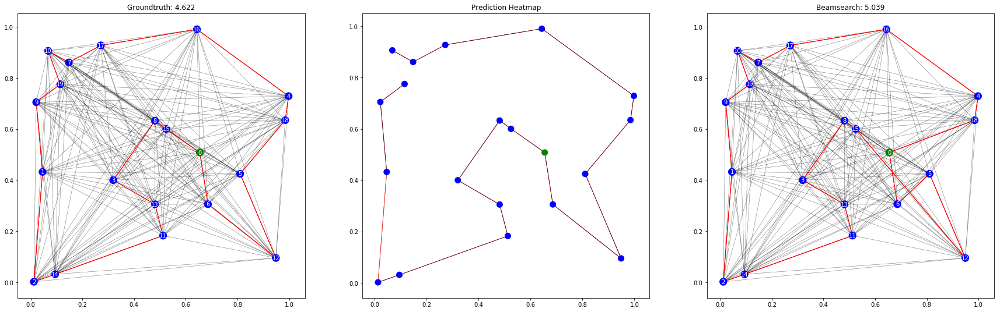

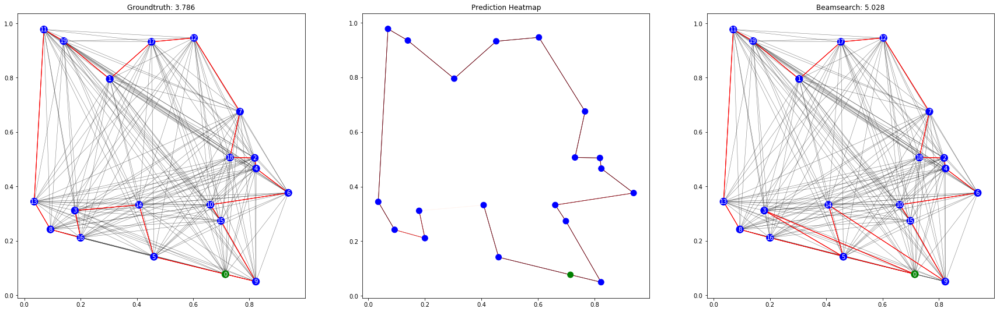

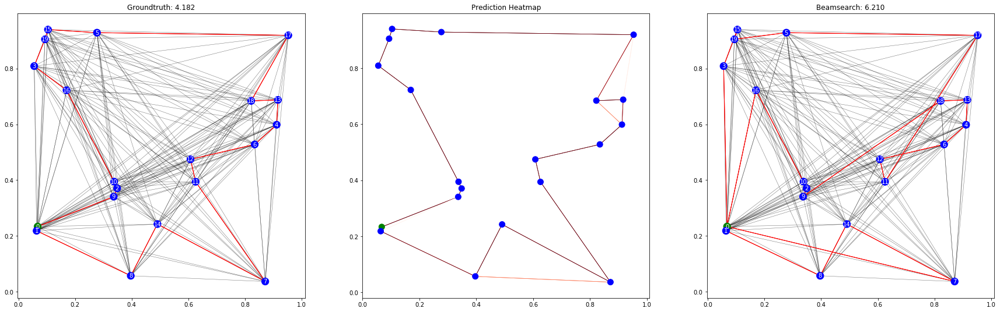

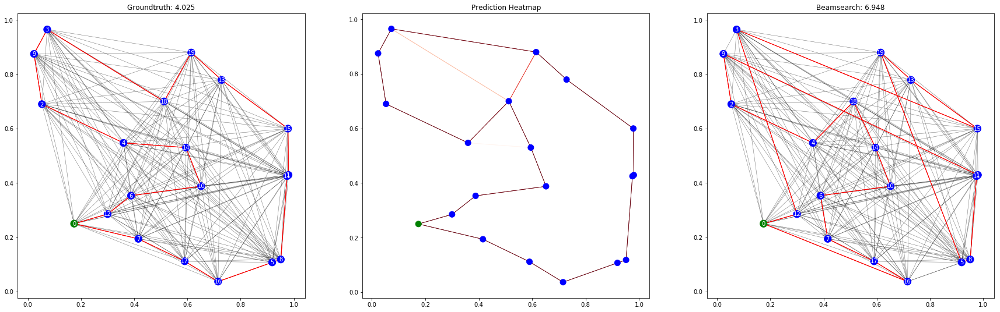

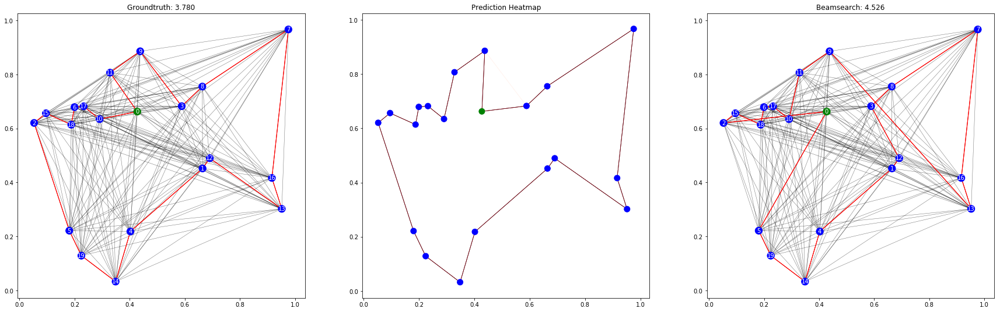

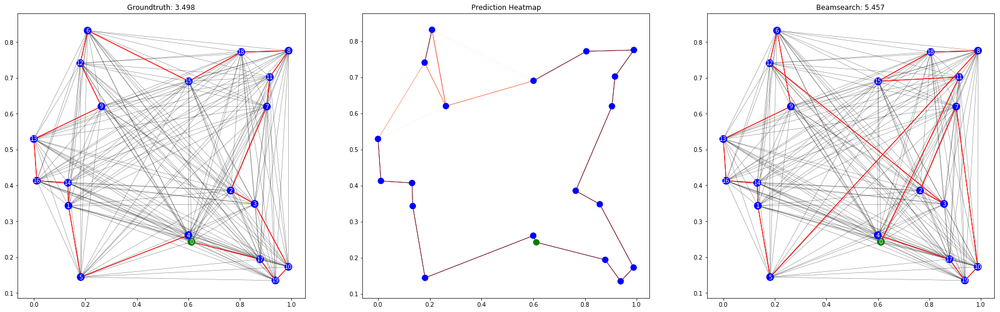

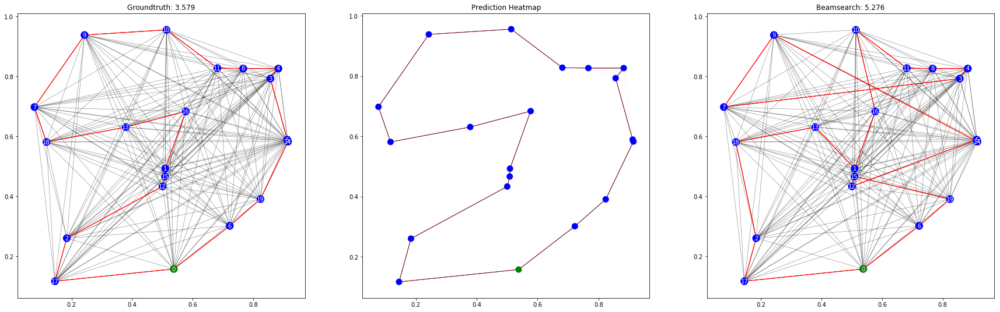

In [12]:
# Set evaluation mode
net.eval()

batch_size = 10
num_nodes = config.num_nodes
num_neighbors = config.num_neighbors
beam_size = config.beam_size
test_filepath = config.test_filepath
dataset = iter(GoogleTSPReader(num_nodes, num_neighbors, batch_size, test_filepath))
batch = next(dataset)

with torch.no_grad():
    # Convert batch to torch Variables
    x_edges = Variable(torch.LongTensor(batch.edges).type(dtypeLong), requires_grad=False)
    x_edges_values = Variable(torch.FloatTensor(batch.edges_values).type(dtypeFloat), requires_grad=False)
    x_nodes = Variable(torch.LongTensor(batch.nodes).type(dtypeLong), requires_grad=False)
    x_nodes_coord = Variable(torch.FloatTensor(batch.nodes_coord).type(dtypeFloat), requires_grad=False)
    y_edges = Variable(torch.LongTensor(batch.edges_target).type(dtypeLong), requires_grad=False)
    y_nodes = Variable(torch.LongTensor(batch.nodes_target).type(dtypeLong), requires_grad=False)
    
    # Compute class weights
    edge_labels = y_edges.cpu().numpy().flatten()
    edge_cw = compute_class_weight("balanced", classes=np.unique(edge_labels), y=edge_labels)
    print("Class weights: {}".format(edge_cw))
    
    # Forward pass
    y_preds, loss = net.forward(x_edges, x_edges_values, x_nodes, x_nodes_coord, y_edges, edge_cw)
    loss = loss.mean()
    
    # Get batch beamsearch tour prediction
    bs_nodes = beamsearch_tour_nodes_shortest(
        y_preds, x_edges_values, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')
    #bs_nodes = beamsearch_tour_nodes(
    #    y_preds, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')

    # Compute mean tour length
    pred_tour_len = mean_tour_len_nodes(x_edges_values, bs_nodes)
    gt_tour_len = np.mean(batch.tour_len)
    print("Predicted tour length: {:.3f} (mean)\nGroundtruth tour length: {:.3f} (mean)".format(pred_tour_len, gt_tour_len))

    # Sanity check
    for idx, nodes in enumerate(bs_nodes):
        if not is_valid_tour(nodes, num_nodes):
            print(idx, " Invalid tour: ", nodes)

    # Plot prediction visualizations
    plot_predictions_beamsearch(x_nodes_coord, x_edges, x_edges_values, y_edges, y_preds, bs_nodes, num_plots=batch_size)

Predicted tour length: 5.316 (mean)
Groundtruth tour length: 3.801 (mean)


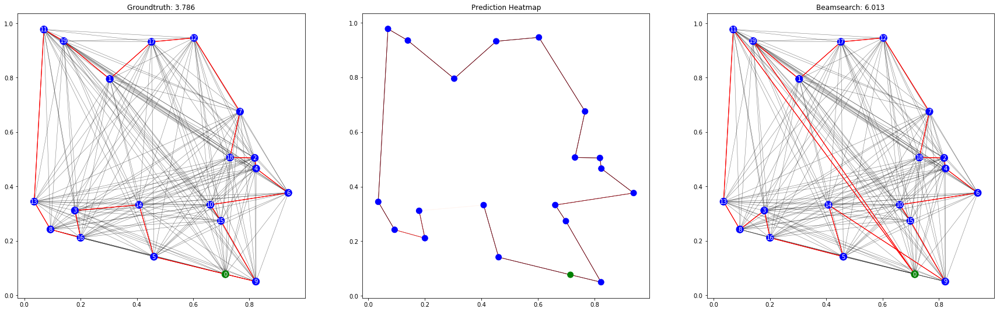

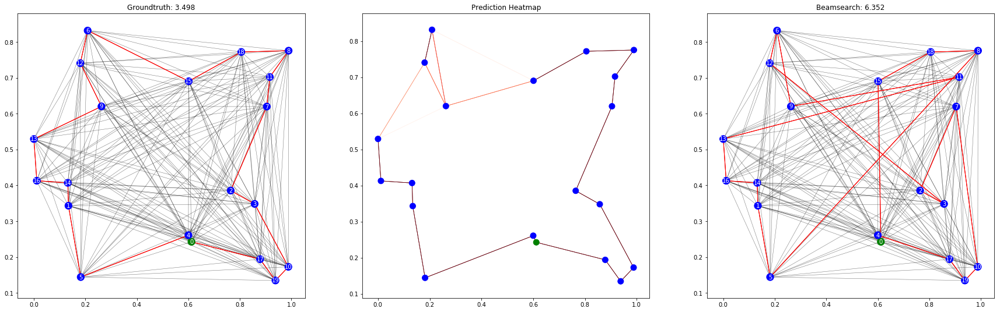

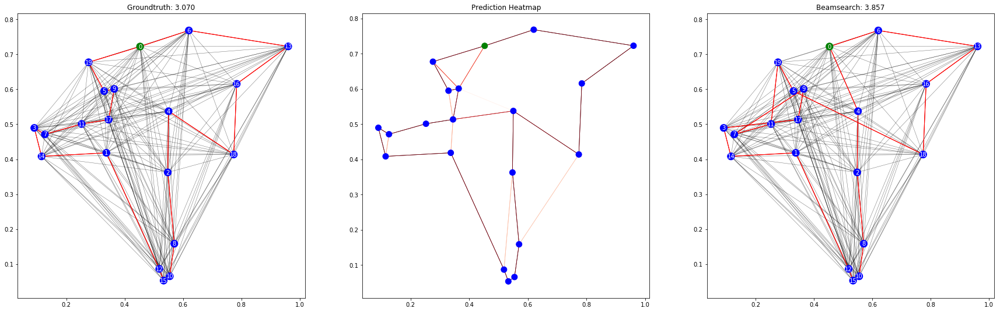

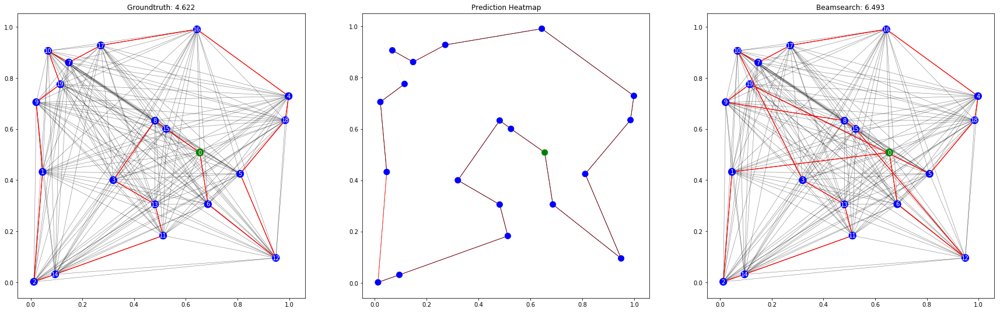

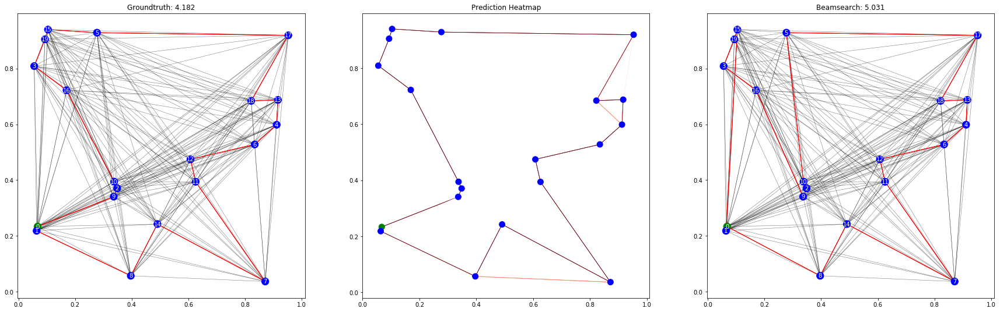

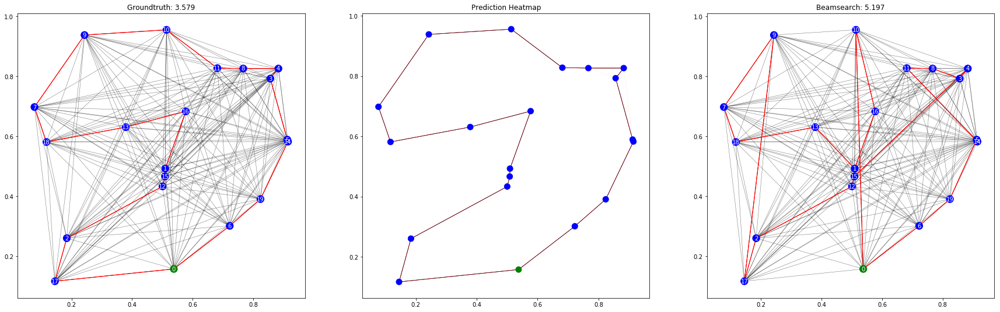

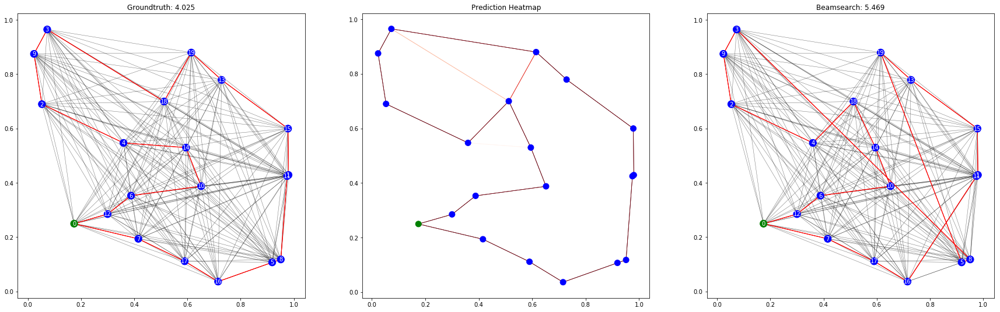

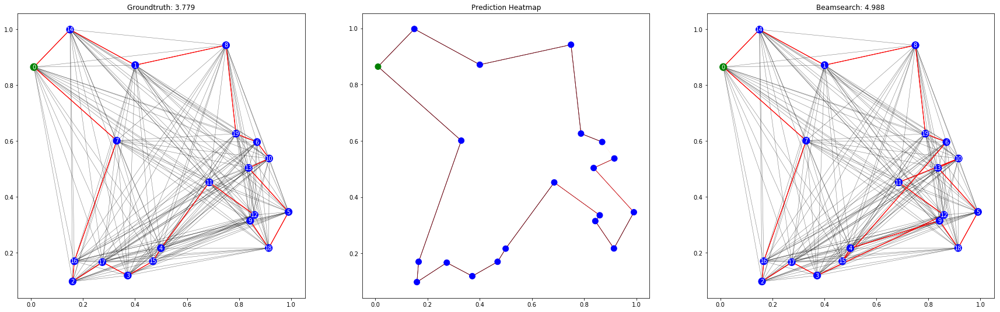

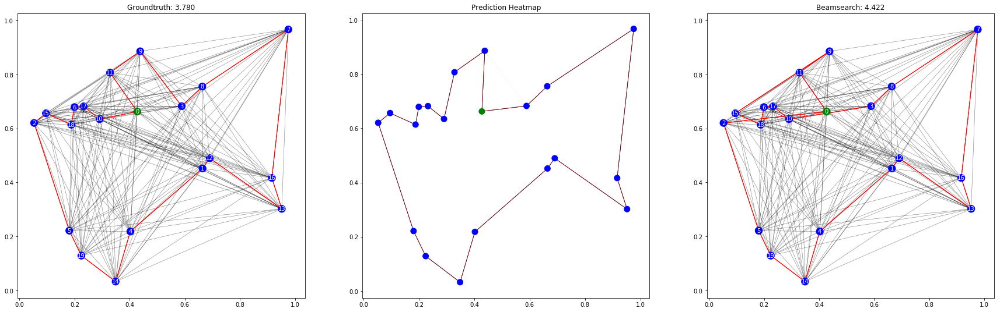

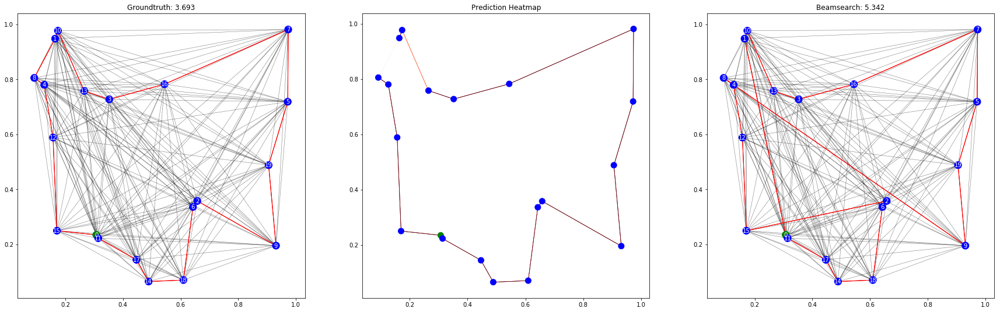

In [13]:
    beam_size = 10000
    
    # Get batch beamsearch tour prediction
    bs_nodes = beamsearch_tour_nodes_shortest(
        y_preds, x_edges_values, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')
    #bs_nodes = beamsearch_tour_nodes(
    #    y_preds, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')

    # Compute mean tour length
    pred_tour_len = mean_tour_len_nodes(x_edges_values, bs_nodes)
    gt_tour_len = np.mean(batch.tour_len)
    print("Predicted tour length: {:.3f} (mean)\nGroundtruth tour length: {:.3f} (mean)".format(pred_tour_len, gt_tour_len))

    # Sanity check
    for idx, nodes in enumerate(bs_nodes):
        if not is_valid_tour(nodes, num_nodes):
            print(idx, " Invalid tour: ", nodes)

    # Plot prediction visualizations
    plot_predictions_beamsearch(x_nodes_coord, x_edges, x_edges_values, y_edges, y_preds, bs_nodes, num_plots=batch_size)

Predicted tour length: 5.095 (mean)
Groundtruth tour length: 3.801 (mean)


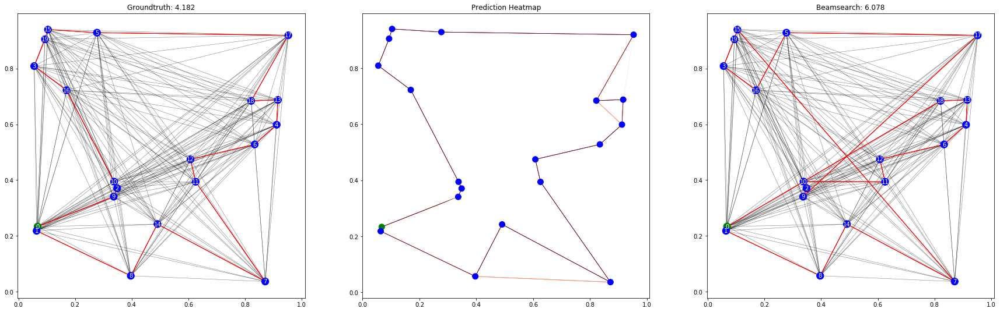

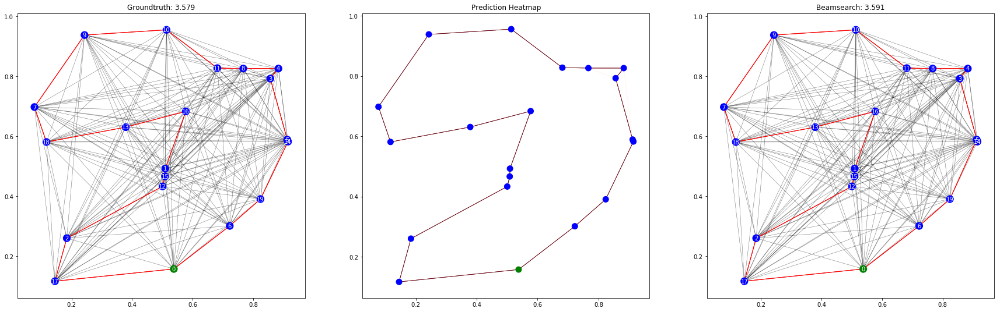

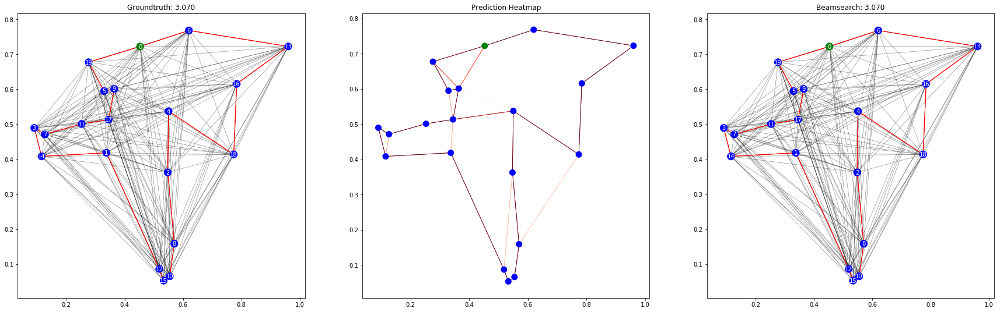

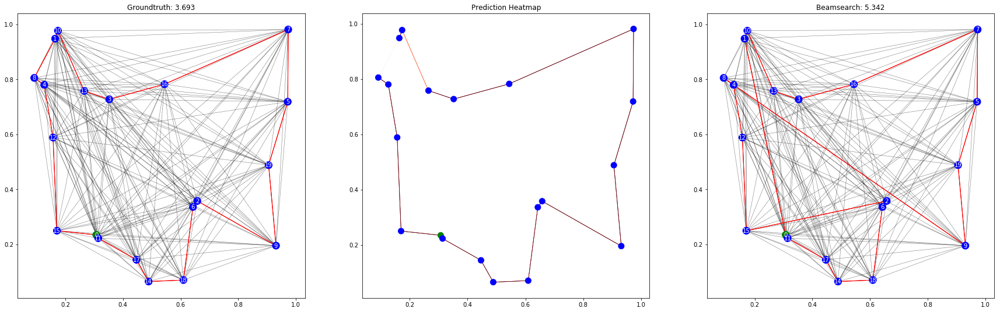

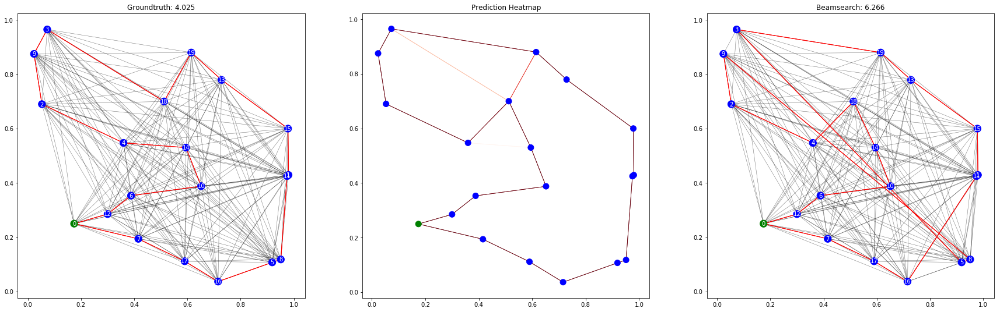

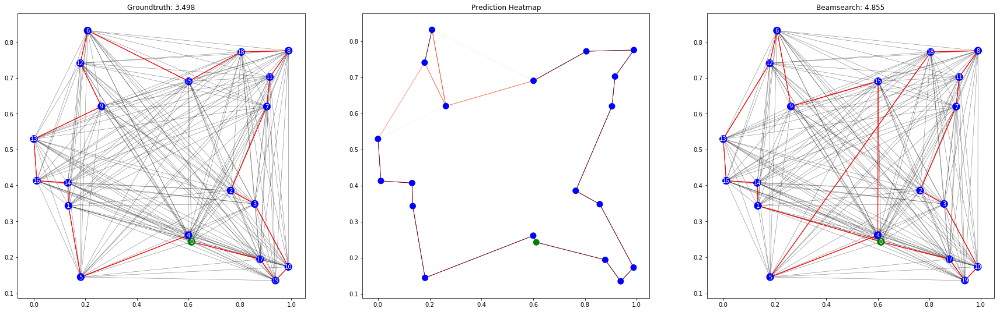

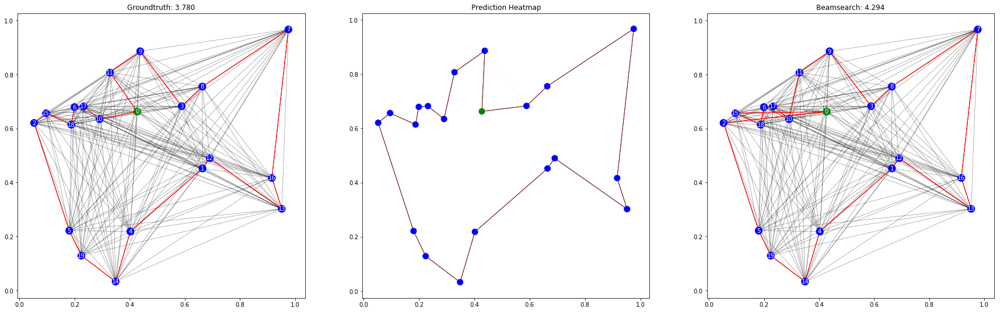

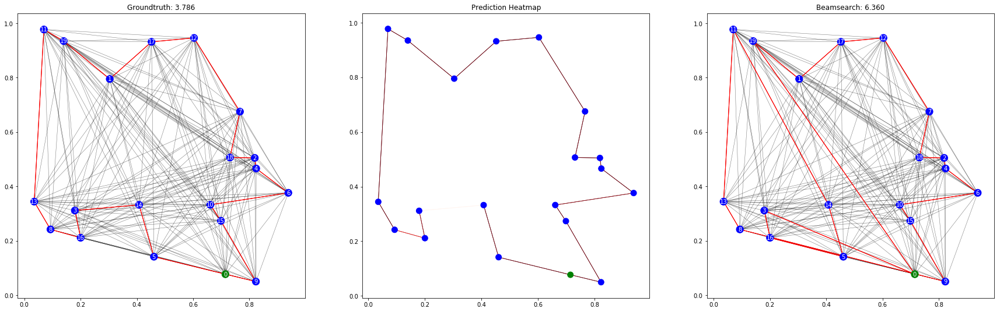

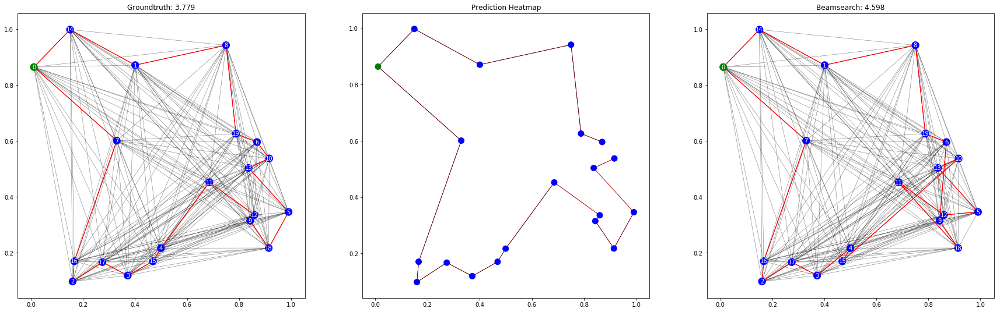

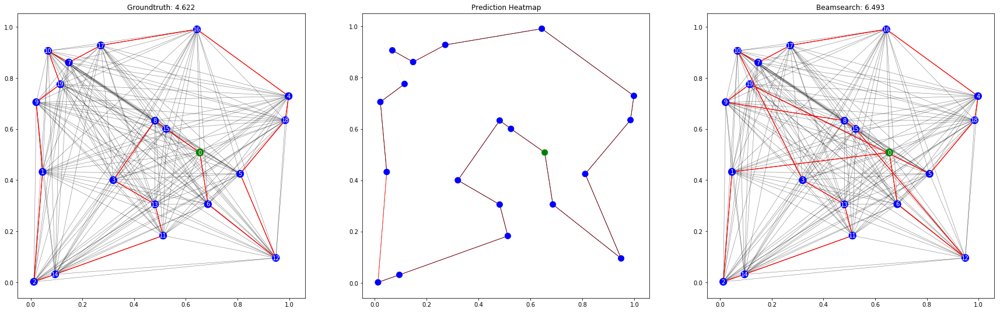

In [14]:
    beam_size = 100000
    
    # Get batch beamsearch tour prediction
    bs_nodes = beamsearch_tour_nodes_shortest(
        y_preds, x_edges_values, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')
    #bs_nodes = beamsearch_tour_nodes(
    #    y_preds, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')

    # Compute mean tour length
    pred_tour_len = mean_tour_len_nodes(x_edges_values, bs_nodes)
    gt_tour_len = np.mean(batch.tour_len)
    print("Predicted tour length: {:.3f} (mean)\nGroundtruth tour length: {:.3f} (mean)".format(pred_tour_len, gt_tour_len))

    # Sanity check
    for idx, nodes in enumerate(bs_nodes):
        if not is_valid_tour(nodes, num_nodes):
            print(idx, " Invalid tour: ", nodes)

    # Plot prediction visualizations
    plot_predictions_beamsearch(x_nodes_coord, x_edges, x_edges_values, y_edges, y_preds, bs_nodes, num_plots=batch_size)